In [540]:
import numpy as np

# pandas
import pandas as pd

pd.option_context("display.max_rows", 5000)
pd.option_context("display.max_columns", 1000)
import pandas_profiling

# matplotlib
import matplotlib.pyplot as plt
import matplotlib as mpl

mpl.rcParams["figure.dpi"] = 300
mpl.rcParams["lines.linewidth"] = 0.85
mpl.rcParams["font.size"] = 5
mpl.rcParams["legend.fontsize"] = 5
mpl.rcParams["legend.title_fontsize"] = 5
mpl.rcParams["axes.labelsize"] = 5
mpl.rcParams["axes.titlesize"] = 5
mpl.rcParams["xtick.labelsize"] = 5
mpl.rcParams["ytick.labelsize"] = 5
mpl.rcParams["figure.figsize"] = (6, 2.5)
mpl.rcParams["lines.marker"] = "o"
mpl.rcParams["lines.markersize"] = 1.5
mpl.rcParams["scatter.marker"] = "o"

import time
import warnings
import xgboost as xgb
import seaborn as sns

from fbprophet import Prophet

# sklearn
from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error
from sklearn.metrics import (
    median_absolute_error,
    mean_squared_error,
    mean_squared_log_error,
)
from sklearn.model_selection import KFold

# scipy
from scipy import stats

# plotly
from plotly.offline import init_notebook_mode, iplot
from plotly import graph_objs as go
import plotly_express as px

init_notebook_mode(connected=True)

# statmodels
import statsmodels.api as sm

In [481]:
df_train = pd.read_csv("dataset/train.csv", parse_dates=["date"], index_col=["date"])
df_test = pd.read_csv("dataset/test.csv", parse_dates=["date"], index_col=["date"])
subs = pd.read_csv("dataset/sample_submission.csv")

## Dataset view

In [482]:
profile = pandas_profiling.ProfileReport(df_train)
profile

Number of variables,4
Number of observations,913000
Total Missing (%),0.0%
Total size in memory,27.9 MiB
Average record size in memory,32.0 B
Numeric,3
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,0


### Per Product Sales (daily)

In [483]:
def product_sale_ts(**product_id):

    """Plotting per product sales time series at daily interval"""

    product_ids = list(product_id.values())
    df_red = df_train[df_train["item"].isin(product_ids)]
    df_red = df_red.reset_index()
    df_red = df_red.sort_values(by=["date", "item"])
    fig = px.line(
        df_red,
        x="date",
        y="sales",
        facet_row="item",
        title="product-sale vs time(daily)",
        color="item",
    )
    fig.update(layout=dict(title=dict(x=0.5)))
    return fig


product_sale_ts(product_id1=1, product_id2=2, product_id3=3)

### Per Shop Sales (weekly)

In [484]:
def store_sales_ts(**store_id):

    """Weekly sale value per store or category"""

    df_train["sales"] = df_train["sales"].astype(float)
    store_ids = list(store_id.values())

    figs = []
    for idx in store_ids:
        sales_store = df_train[df_train["store"] == idx]["sales"].sort_index(
            ascending=True
        )
        sales_store = sales_store.resample("W").sum()
        fig = px.line(
            sales_store.reset_index(),
            x="date",
            y="sales",
            title="weekly sale value per store {}".format(idx),
            height=400,
        )
        fig.update(layout=dict(title=dict(x=0.5)))
        figs.append(fig)

    return figs


figs = store_sales_ts(store_id1=1, store_id2=2)
for fig in figs:
    iplot(fig)

### Yearly periodicity plot per store

In [485]:
def store_sales_decomp_yr(**store_id):

    """Decomposing the store sales trend"""

    store_ids = list(store_id.values())

    figs = []
    for idx in store_ids:
        sales_stores = df_train[df_train["store"] == idx]["sales"].sort_index(
            ascending=True
        )
        sales_decomp = sm.tsa.seasonal_decompose(
            sales_stores, model="additive", freq=365
        )
        fig = px.line(
            sales_decomp.trend.reset_index(),
            x="date",
            y="sales",
            height=400,
            title="Yearly trendline of store {}".format(idx),
        )
        fig.update(layout=dict(title=dict(x=0.5)))
        figs.append(fig)
    return figs


figs = store_sales_decomp_yr(store_id1=5)
for fig in figs:
    iplot(fig)

### Monthly trend over the years

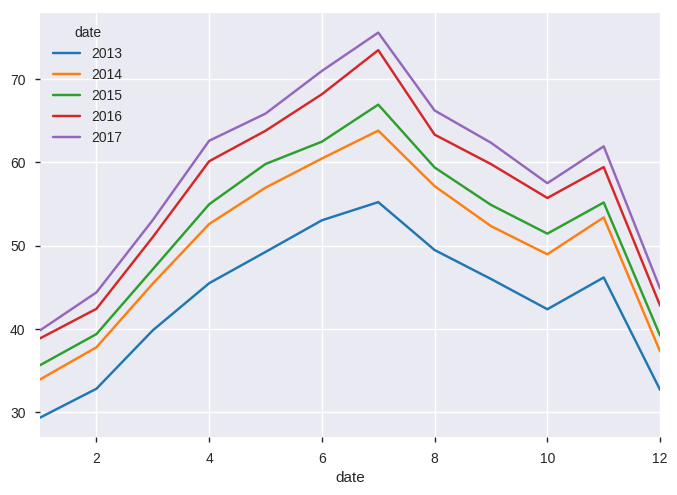

In [486]:
pivoted = pd.pivot_table(
    df_train,
    values="sales",
    columns=df_train.index.year,
    index=df_train.index.month,
    aggfunc="mean",
)
fig = pivoted.plot()

### Weekly trend over the years

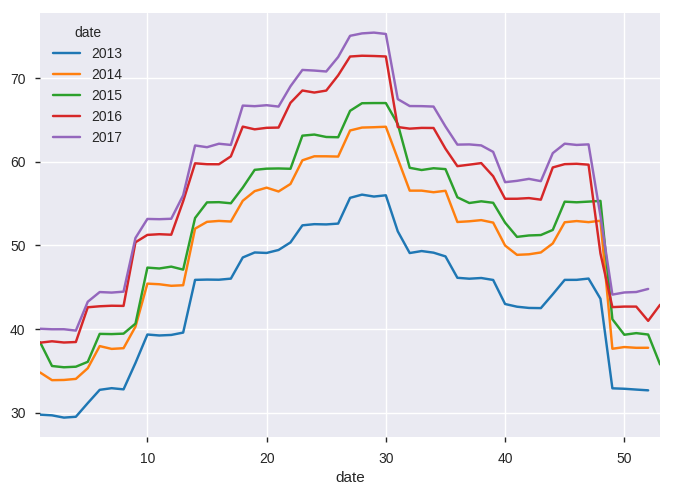

In [487]:
pivoted = pd.pivot_table(
    df_train,
    values="sales",
    columns=df_train.index.year,
    index=df_train.index.week,
    aggfunc="mean",
)
fig = pivoted.plot()

### Per product Swarmplot